In [1]:
using LinearAlgebra
using Plots

In [2]:
# Definición de las matrices de Pauli
sigmax = [0 1.0; 1 0]
sigmay = [0 -1.0im; im 0]  # im representa la unidad imaginaria √(-1)
sigmaz = [1.0 0; 0 -1]

2×2 Matrix{Float64}:
 1.0   0.0
 0.0  -1.0

In [3]:
kron([sigmaz,sigmaz,I(2)]...)

8×8 Matrix{Float64}:
 1.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0
 0.0  1.0   0.0   0.0   0.0   0.0   0.0   0.0
 0.0  0.0  -1.0   0.0   0.0   0.0  -0.0   0.0
 0.0  0.0   0.0  -1.0   0.0   0.0   0.0  -0.0
 0.0  0.0   0.0   0.0  -1.0   0.0  -0.0   0.0
 0.0  0.0   0.0   0.0   0.0  -1.0   0.0  -0.0
 0.0  0.0  -0.0   0.0  -0.0   0.0   1.0   0.0
 0.0  0.0   0.0  -0.0   0.0  -0.0   0.0   1.0

In [4]:
sigmas = Dict(1=>sigmax, 2=>sigmay, 3=>sigmaz)
function Sigma(indice, pos, totalparticulas)
    id = I(2) #[1.0 0; 0 1.0]
    mat = sigmas[indice]
    list = []
    for i in 0:totalparticulas-1
        if i == pos 
            append!(list,[mat])
        else 
            append!(list,[id])
        end
        #println("$list")
    end
    return kron(list...)
end

Sigma (generic function with 1 method)

En un campo externo el modelo de Ising es 

$ H = - J \sum_{i=1}^{3}\sigma_i \sigma_{i+1} -h \sum_{i=1}^4 S_i  $ 

In [5]:
# Para la cadena abierta con n partículas tenemos usamos cerrada = false, para la cadena cerrada usamos cerrada = true
function Ising(N; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Sigma(1,j,totalparticulas)
    end
    return H 
end

Ising (generic function with 1 method)

In [6]:
J = 1
h = 1
Ising(4,cerrada = false)

16×16 Matrix{Float64}:
 3.0  1.0   1.0  0.0   1.0   0.0   0.0  …   0.0   0.0  0.0   0.0  0.0  0.0
 1.0  1.0   0.0  1.0   0.0   1.0   0.0      0.0   0.0  0.0   0.0  0.0  0.0
 1.0  0.0  -1.0  1.0   0.0   0.0   1.0      1.0   0.0  0.0   0.0  0.0  0.0
 0.0  1.0   1.0  1.0   0.0   0.0   0.0      0.0   1.0  0.0   0.0  0.0  0.0
 1.0  0.0   0.0  0.0  -1.0   1.0   1.0      0.0   0.0  1.0   0.0  0.0  0.0
 0.0  1.0   0.0  0.0   1.0  -3.0   0.0  …   0.0   0.0  0.0   1.0  0.0  0.0
 0.0  0.0   1.0  0.0   1.0   0.0  -1.0      0.0   0.0  0.0   0.0  1.0  0.0
 0.0  0.0   0.0  1.0   0.0   1.0   1.0      0.0   0.0  0.0   0.0  0.0  1.0
 1.0  0.0   0.0  0.0   0.0   0.0   0.0      1.0   0.0  1.0   0.0  0.0  0.0
 0.0  1.0   0.0  0.0   0.0   0.0   0.0      0.0   1.0  0.0   1.0  0.0  0.0
 0.0  0.0   1.0  0.0   0.0   0.0   0.0  …  -3.0   1.0  0.0   0.0  1.0  0.0
 0.0  0.0   0.0  1.0   0.0   0.0   0.0      1.0  -1.0  0.0   0.0  0.0  1.0
 0.0  0.0   0.0  0.0   1.0   0.0   0.0      0.0   0.0  1.0   1.0  1.0  0.0
 0

In [7]:
ishermitian(Ising(4))

true

In [8]:
typeof(eigen(Ising(4)))
size(Ising(4))

(16, 16)

In [9]:
Al= eigen(Ising(4))
Al.vectors;

In [10]:
lambda, V = eigen(Ising(4,cerrada = true));

In [11]:
example = Dict(:cerrada => true)  # Se utiliza el : para definir la llave (key) del diccionario
typeof(:a)

Symbol

In [12]:
Ising(6;example...)

64×64 Matrix{Float64}:
 6.0  1.0  1.0  0.0  1.0   0.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  2.0  0.0  1.0  0.0   1.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  2.0  1.0  0.0   0.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  1.0  2.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  2.0   1.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  1.0  -2.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.0  1.0   0.0  2.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0   1.0  1.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0   0.0  0.0     0.0   0.0  0.0  0.0  0.0  0.0  0.0
 ⋮                         ⋮         ⋱                  ⋮              
 0.0  0.0  0.0  0.0  0.0   0.0  0.0  …  0.0   0.0  0.0  0.0  0.0  0.0  1.0
 0.0  0.0  0.0  0.0  0.0   0.0  0.0     1.0   1.0  0.0  1.0  0.0  0.0  0.0
 0.0 

In [13]:
# En un campo externo h 
function Ising2(N,h; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Sigma(1,j,totalparticulas)
    end
    return H 
end

Ising2 (generic function with 1 method)

In [60]:
N = 4 # Número de partículas 
list = []
for b in 0:0.001:1
     Ham = Ising2(N,b,cerrada = false)
     Vals = eigen(Ham).values
     append!(list,map(x->[b,x],Vals))
end
list
x_list = [l[1] for l in list]
y_list = [l[2] for l in list]

16016-element Vector{Float64}:
 -3.0
 -3.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
  1.0
  1.0
  ⋮
 -0.30540728933227523
  0.30540728933228145
  1.0000000000000002
  1.0000000000000067
  1.6945927106677234
  2.064177772475915
  2.758770483143632
  4.064177772475913
  4.758770483143634

16016-element Vector{Float64}:
 -3.0
 -3.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
  1.0
  1.0
  ⋮
 -0.30540728933227523
  0.30540728933228145
  1.0000000000000002
  1.0000000000000067
  1.6945927106677234
  2.064177772475915
  2.758770483143632
  4.064177772475913
  4.758770483143634

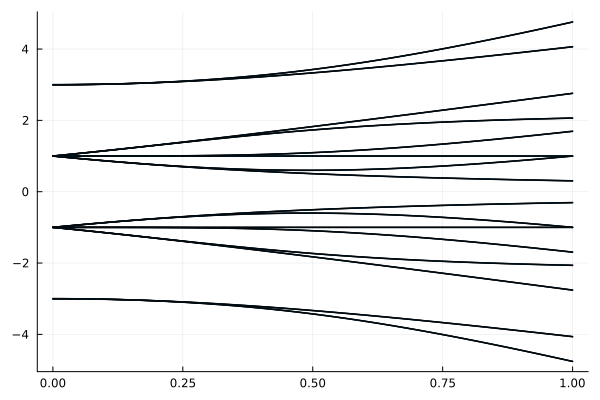

In [16]:
scatter(x_list,y_list, label = false, markersize = 0.5)
# Con el campo se rompe la simetría esférica (se rompe la degeneración)

In [17]:
function IsingRand(N,b,Aleat; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N

    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ Aleat[i+1]*(Sigma(3, mod(i,N),totalparticulas)*Sigma(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ b*Sigma(1,j,totalparticulas)
    end
    return H 
end

IsingRand (generic function with 1 method)

In [18]:
epsilon = 0.5
a1 = 1-epsilon
b1 = 1+epsilon
Nrand = 4 # Número de partículas 
Aleat = rand(Nrand).*(b1-a1).+a1

4-element Vector{Float64}:
 0.972179015128424
 0.686208304806444
 1.475672643667021
 1.3664553109564666

In [19]:
listrand = []

for b in 0:0.001:1
     Ham = IsingRand(Nrand,b,Aleat,cerrada = false)
     Vals = eigen(Ham).values
     append!(listrand,map(x->[b,x],Vals))
end
Aleat

4-element Vector{Float64}:
 0.972179015128424
 0.686208304806444
 1.475672643667021
 1.3664553109564666

In [20]:
x_listrand = [l[1] for l in listrand]
y_listrand = [l[2] for l in listrand];

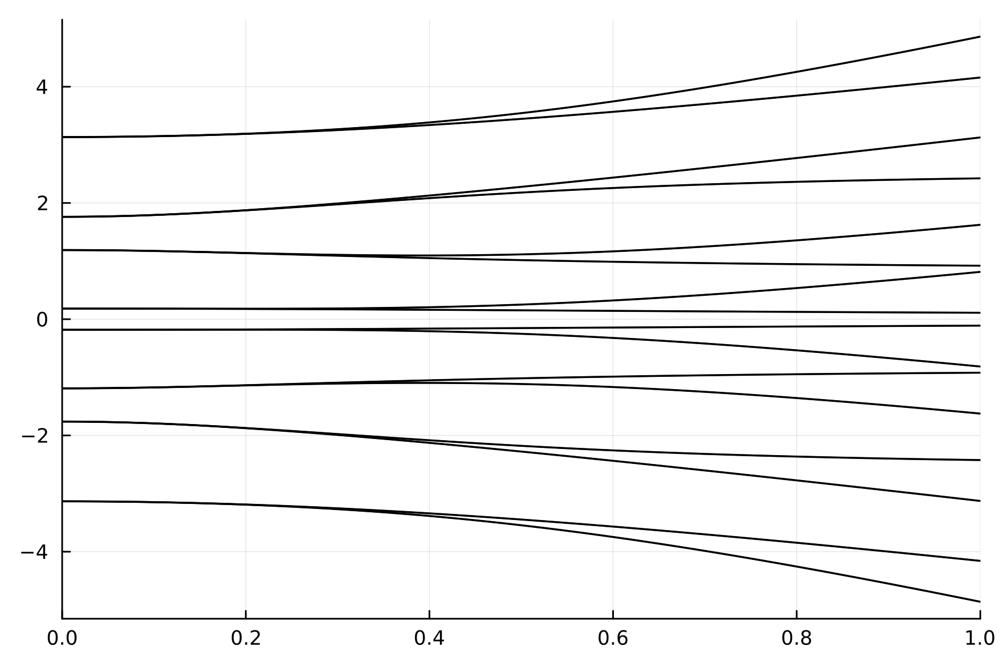

In [21]:
scatter(x_listrand,y_listrand, label = false, markersize = 0.25, dpi = 300,xlims= (0,1))#,  ylims=(-0.5,0.75) )#, xlims=(0.,1.25), ylims=(-2,2.25))

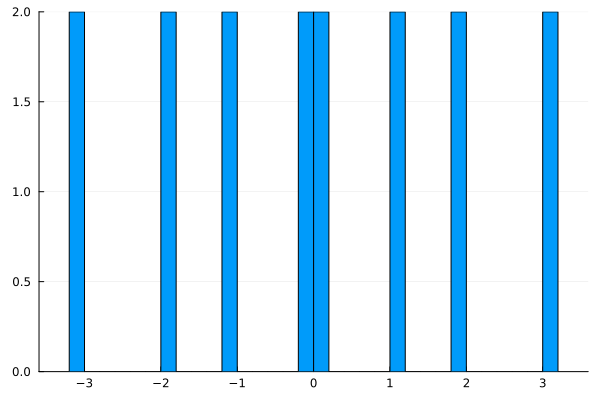

In [22]:
# Calcularemos Valores Propios para b fijo
ValoresPropios = eigen(IsingRand(Nrand,0.2,Aleat; cerrada = false)).values
histogram(ValoresPropios, bins = 50, label = false)

In [23]:
AHist = [-ValoresPropios[i]+ ValoresPropios[i+1] for i in 1:length(ValoresPropios)-1]

15-element Vector{Float64}:
 0.00314702593442151
 1.3129373513930624
 0.0031470259344332785
 0.7330698274556413
 0.0031470259344295037
 0.9562732065002538
 0.0031470259344295592
 0.3535171189583801
 0.003147025934429948
 0.9562732065002528
 0.0031470259344295037
 0.7330698274556442
 0.0031470259344295037
 1.3129373513930604
 0.0031470259344295037

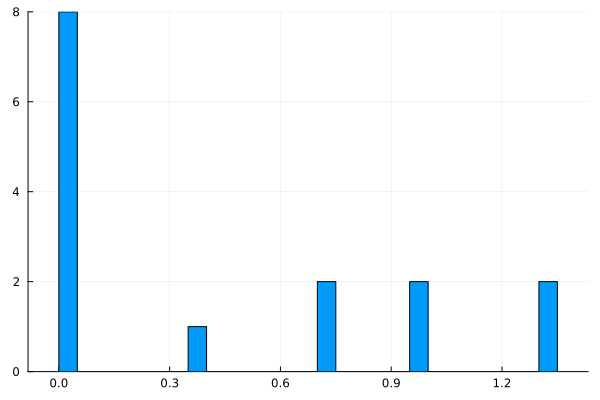

In [24]:
histogram(AHist, bins = 50, label = false)

In [25]:
ValoresPropios = eigen(IsingRand(2,0.2,Aleat; cerrada = false)).values

4-element Vector{Float64}:
 -1.0512526040186874
 -0.972179015128424
  0.972179015128424
  1.051252604018688

In [26]:
IsingRand(2,0.2,Aleat; cerrada = false)

4×4 Matrix{Float64}:
 0.972179   0.2        0.2       0.0
 0.2       -0.972179   0.0       0.2
 0.2        0.0       -0.972179  0.2
 0.0        0.2        0.2       0.972179

$ \hat P = \prod_{i=1}^N \sigma_i^x$

Actividad/Tarea 

Encontrar eigenvectores 

Encontrar proyector correspondiente al eigenvalor 1 (a todos los elementos con eigenvalor 1)
y al eigenvalor -1 

los proyectores son $\ket{v_1}\bra{v_1} + ...$

$\tilde H_{ij} = \bra{v_i}H\ket{v_j}$



In [27]:
function parity(particles)
    list = [sigmas[1] for _ in 1:particles]
    return kron(list...)
end

parity (generic function with 1 method)

In [71]:
# N es Número de partículas 
# b es el campo externo
Ham = IsingRand(2,0.01,Aleat; cerrada = false)
eigen(Ham)

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
4-element Vector{Float64}:
 -0.9723847167947832
 -0.9721790151284235
  0.9721790151284239
  0.972384716794784
vectors:
4×4 Matrix{Float64}:
  0.00727227   8.32667e-15   0.707107     0.707069
 -0.707069     0.707107      3.99799e-15  0.00727227
 -0.707069    -0.707107      3.84098e-15  0.00727227
  0.00727227   8.1627e-15   -0.707107     0.707069

In [53]:
function ProjectionParity(N,b, Aleat; cerrada = false, Positive = true)
    H = IsingRand(N,b,Aleat, cerrada = false)
    P = parity(N)

    vals, v = eigen(P) 

    if Positive == true 
        vec = v[:,findall(vals .== 1)]
    elseif Positive == false 
        vec = v[:, findall(vals .< 0)]
    end

    num = Int((2^N)/2)
    Projection = zeros(num,num)

    for k in 1:num
        for j in 1:2^(N-1)
            Projection[j,k] = vec[:,j]'*H*vec[:,k]
        end
    end
    return Projection
end

ProjectionParity (generic function with 1 method)

In [69]:
Hpos = ProjectionParity(2,1,Aleat, cerrada = false, Positive = true)
Hneg = ProjectionParity(2,1,Aleat, cerrada = false, Positive = false)



2×2 Matrix{Float64}:
 -0.972179     4.93038e-32
  4.93038e-32  0.972179

In [95]:
N = 4 # Número de partículas 
listProj1 = []
for b in 0:0.01:1
     Hpos = ProjectionParity(4,b,Aleat, cerrada = false, Positive = true)
     ValsProj1 = eigen(Hpos).values
     append!(listProj1,map(x->[b,x],ValsProj1))
end
x_listProj = [l[1] for l in listProj1]
y_listProj = [l[2] for l in listProj1]

listProj2 = []
for b in 0:0.01:1
     Hpos = ProjectionParity(4,b,Aleat, cerrada = false, Positive = false)
     ValsProj2 = eigen(Hpos).values
     append!(listProj2,map(x->[b,x],ValsProj2))
end
x_listProj2 = [l[1] for l in listProj2]
y_listProj2 = [l[2] for l in listProj2]

808-element Vector{Float64}:
 -3.1340599636018887
 -1.761643353989001
 -1.1897019333450412
 -0.18271467626784713
  0.18271467626784713
  1.1897019333450412
  1.761643353989001
  3.1340599636018887
 -3.134198548502417
 -1.7619667159834154
  ⋮
  4.142288006622317
 -4.158502351191743
 -3.127347065881964
 -1.6241823512536344
 -0.814300141079932
  0.8143001410799338
  1.6241823512536375
  3.1273470658819713
  4.158502351191751

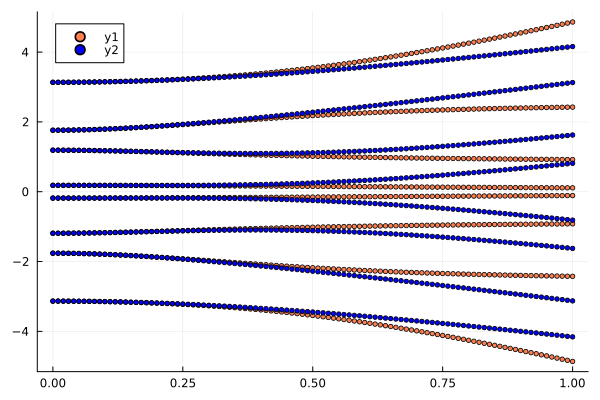

In [101]:
scatter(x_listProj,y_listProj, color = "coral", markersize =2.5)
scatter!(x_listProj2, y_listProj2, color = "blue", markersize = 2.5)
